# Mapping multiome data on the original atlas with extended annotations

In [1]:
here::i_am("rna/mapping/run/parse_sample_metadata_after_mapping.R")

source(here::here("settings.R"))
library(Seurat)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/code

Attaching SeuratObject


Attaching package: ‘Seurat’


The following object is masked from ‘package:SummarizedExperiment’:

    Assays




In [2]:
io$basedir

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome"

In [3]:
# We want to specify as many variables as possible in the very beginning and as few as possible in the actual code
# If you do this, you can reproduce your code for other projects with only having to change the variables in the first block
# Otherwise, you will have to go through the whole code and change all places that have certain variables

#Specify paths to HE multiome files
io$multiome_metadata = file.path(io$basedir, "results/rna/mapping/sample_metadata_after_mapping.txt.gz") # This specifies to a location within the main folder
io$multiome_sce = file.path(io$basedir, "data/processed/rna/SingleCellExperiment.rds")

#Specify paths to reference atlas
io$atlas_sce = "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/embryo_sce.rds"

#outdir
io$outdir = file.path(io$basedir, '/results/rna/mapping/seurat/')
dir.create(io$outdir, recursive=T, showWarning=F)

### Load in Objects & Metadata

In [4]:
#Load in Metadata for multiome Reference 
# Remove T KO & E7.75 as sample looks like it failed
multiome_metadata = fread(io$multiome_metadata)[pass_rnaQC == TRUE & doublet_call==FALSE & !sample %in% c('E8.5_CRISPR_T_KO', 'E8.5_CRISPR_T_WT') & stage != 'E7.75']
 
# Load in multiome Mouse Gastrulation Atlas SCE Object (Reference Atlas)
multiome_sce = readRDS(io$multiome_sce)
multiome_sce = multiome_sce[,multiome_metadata$cell]

In [5]:
unique(multiome_sce$stage)

[1] "E7.5"  "E8.0"  "E8.5"  "E8.75"

In [6]:
extended.sce = readRDS(io$atlas_sce)
meta = colData(extended.sce) %>% 
    as.data.table() %>% 
    .[embryo_version=='Original']
# Subset to original atlas
original_sce = extended.sce[,as.character(meta$cell)]
rm(extended.sce)

In [7]:
# Rename ensemble IDs to gene names in the atlas
gene_metadata <- fread(io$gene_metadata) %>% 
    .[,c("chr","ens_id","symbol")] %>%
     .[symbol!="" & ens_id%in%rownames(original_sce)] %>%
     .[!duplicated(symbol)]

original_sce <- original_sce[rownames(original_sce) %in% gene_metadata$ens_id,]
foo <- gene_metadata$symbol; names(foo) <- gene_metadata$ens_id
rownames(original_sce) <- foo[rownames(original_sce)]

In [8]:
original_sce

class: SingleCellExperiment 
dim: 27561 116312 
metadata(0):
assays(1): counts
rownames(27561): Xkr4 Gm1992 ... mt-Nd6 mt-Cytb
rowData names(0):
colnames(116312): cell_1 cell_2 ... cell_139330 cell_139331
colData names(19): cell sample ... celltype_extended_atlas sizeFactor
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

## Convert reference Single Cell object to a Seurat Object

In [9]:
library(Seurat)

In [10]:
# Multi core using future - built in to seurat
plan("multicore", workers = 24)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

In [11]:
multiome_seurat <- as.Seurat(multiome_sce, counts = "counts", data = NULL)
multiome_seurat@meta.data$dataset <- 'multiome'

In [12]:
# Set the rownames of the meta datatable to the $cell column
rownames(multiome_metadata) <- multiome_metadata$cell
#Add Metadata to In Vivo Seurat Object
multiome_seurat <- AddMetaData(multiome_seurat, metadata = multiome_metadata)

In [13]:
original_seurat <- as.Seurat(original_sce, counts = "counts", data = NULL)
original_seurat@meta.data$dataset <- 'original'

In [14]:
rm(original_sce)
rm(multiome_sce)

## Atlas - QC, Normalization, PCA and UMAP

In [15]:
# make sure assay names are the same!
original_seurat@assays$RNA = original_seurat@assays$originalexp
original_seurat@active.assay = 'RNA'

In [16]:
# normalize and identify variable features for each dataset independently
original_seurat <- NormalizeData(original_seurat)
original_seurat <- FindVariableFeatures(original_seurat, selection.method = "vst", nfeatures = 2000)

#### Atlas - without regressing variables

In [17]:
# Run the standard workflow for visualization and clustering
original_seurat <- ScaleData(original_seurat, verbose = FALSE)
original_seurat <- RunPCA(original_seurat, npcs = 30, verbose = FALSE)

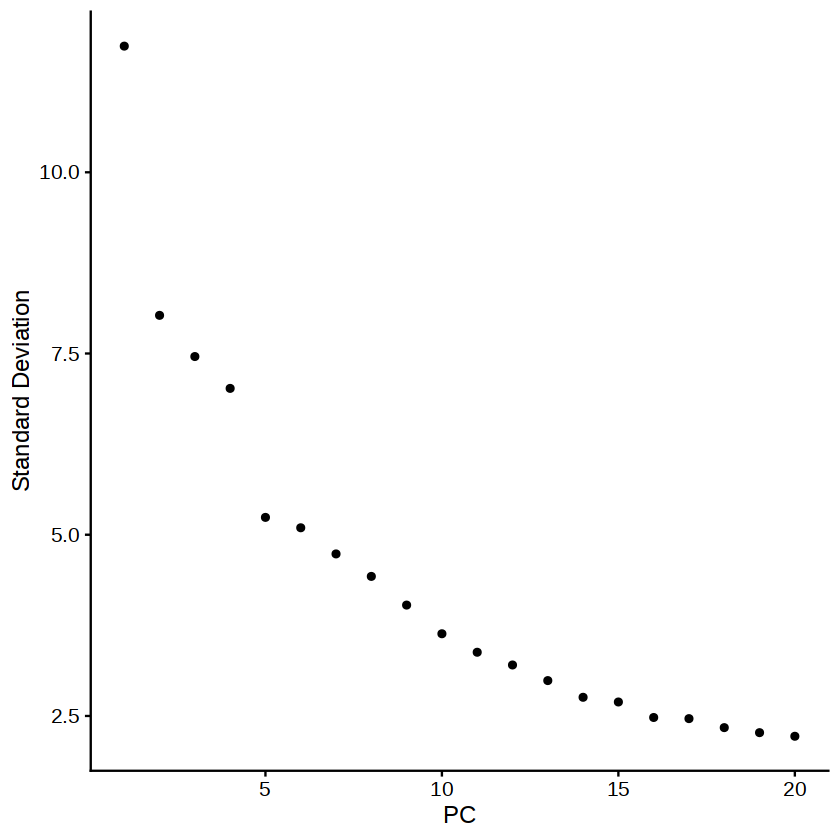

In [18]:
ElbowPlot(object = original_seurat)

In [19]:
original_seurat <- RunUMAP(original_seurat, reduction = "pca", dims = 1:20, n.neighbors = 30, verbose = FALSE)

options(repr.plot.width=20, repr.plot.height=10)


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [20]:
colnames(original_seurat@meta.data)

[1] "orig.ident"                                     
 [2] "nCount_originalexp"                             
 [3] "nFeature_originalexp"                           
 [4] "cell"                                           
 [5] "sample"                                         
 [6] "embryo_version"                                 
 [7] "stage"                                          
 [8] "stage_mixed_gastrulation_mapped"                
 [9] "somite_count"                                   
[10] "anatomy"                                        
[11] "S_score"                                        
[12] "G2M_score"                                      
[13] "phase"                                          
[14] "r_louvain_clus"                                 
[15] "r_louvain_subclus"                              
[16] "louvain"                                        
[17] "leiden"                                         
[18] "celltype_PijuanSala2019"                        
[19] "celltype_PijuanSala2019_E85mapped"              
[20] "celltype_PijuanSala2019_E85mapped_WOTdescendant"
[21] "celltype_extended_atlas"                        
[22] "sizeFactor"                                     
[23] "dataset"

In [21]:
original_seurat@meta.data$celltype = gsub(' ', '_', gsub('/', '_', original_seurat@meta.data$celltype_PijuanSala2019))    

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



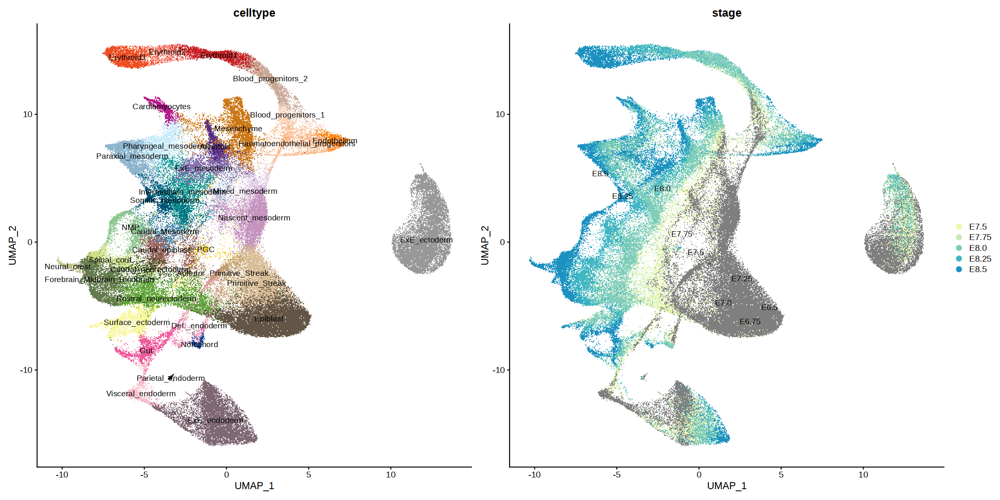

In [22]:
# Visualization
p3 <- DimPlot(original_seurat, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=opts$celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(original_seurat, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE) + scale_color_manual(values=opts$stage.colors)
p3 + p4

#### Atlas - with regressing variables

In [17]:
colnames(original_seurat@meta.data)

[1] "orig.ident"                                     
 [2] "nCount_originalexp"                             
 [3] "nFeature_originalexp"                           
 [4] "cell"                                           
 [5] "sample"                                         
 [6] "embryo_version"                                 
 [7] "stage"                                          
 [8] "stage_mixed_gastrulation_mapped"                
 [9] "somite_count"                                   
[10] "anatomy"                                        
[11] "S_score"                                        
[12] "G2M_score"                                      
[13] "phase"                                          
[14] "r_louvain_clus"                                 
[15] "r_louvain_subclus"                              
[16] "louvain"                                        
[17] "leiden"                                         
[18] "celltype_PijuanSala2019"                        
[19] "celltype_PijuanSala2019_E85mapped"              
[20] "celltype_PijuanSala2019_E85mapped_WOTdescendant"
[21] "celltype_extended_atlas"                        
[22] "sizeFactor"                                     
[23] "dataset"

In [18]:
original_seurat$nCount_RNA = original_seurat$nCount_originalexp
original_seurat$nFeature_RNA = original_seurat$nFeature_originalexp

In [19]:
original_seurat <- PercentageFeatureSet(original_seurat, pattern = "^Mt-", col.name = "mitochondrial_percent_RNA")
original_seurat <- PercentageFeatureSet(original_seurat, pattern = "^Rp[l|s]", col.name = "ribosomal_percent_RNA")

In [20]:
# Run the standard workflow for visualization and clustering
original_seurat_regress <- ScaleData(original_seurat, verbose = FALSE, vars.to.regress = c("nFeature_originalexp", "nCount_originalexp", "mitochondrial_percent_RNA", "ribosomal_percent_RNA"))
original_seurat_regress <- RunPCA(original_seurat_regress, npcs = 30, verbose = FALSE)

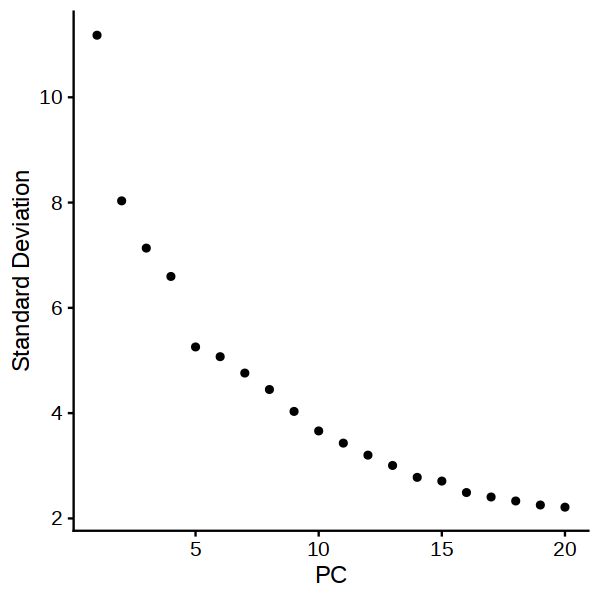

In [27]:
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = original_seurat_regress)

In [28]:
original_seurat_regress <- RunUMAP(original_seurat_regress, reduction = "pca", dims = 1:20, n.neighbors = 30, verbose = FALSE)

options(repr.plot.width=20, repr.plot.height=10)


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



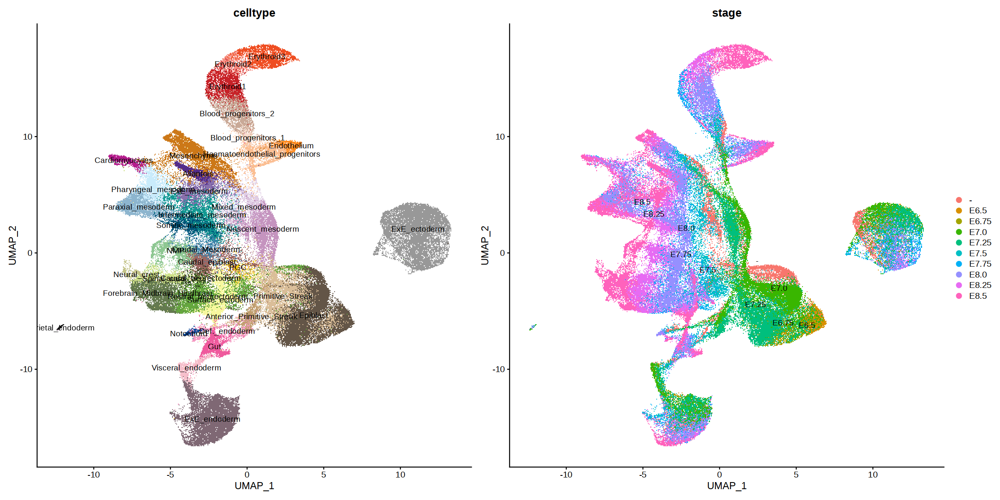

In [29]:
# Visualization
p3 <- DimPlot(original_seurat_regress, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=opts$celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(original_seurat_regress, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE)
p3 + p4

## multiome atlas - QC, Normalization, PCA and UMAP 

In [21]:
# normalize and identify variable features for each dataset independently
multiome_seurat <- NormalizeData(multiome_seurat)
multiome_seurat <- FindVariableFeatures(multiome_seurat, selection.method = "vst", nfeatures = 2000)

#### HE multiome - without regressing variables

In [31]:
# Run the standard workflow for visualization and clustering
multiome_seurat <- ScaleData(multiome_seurat, verbose = FALSE)
multiome_seurat <- RunPCA(multiome_seurat, npcs = 30, verbose = FALSE)

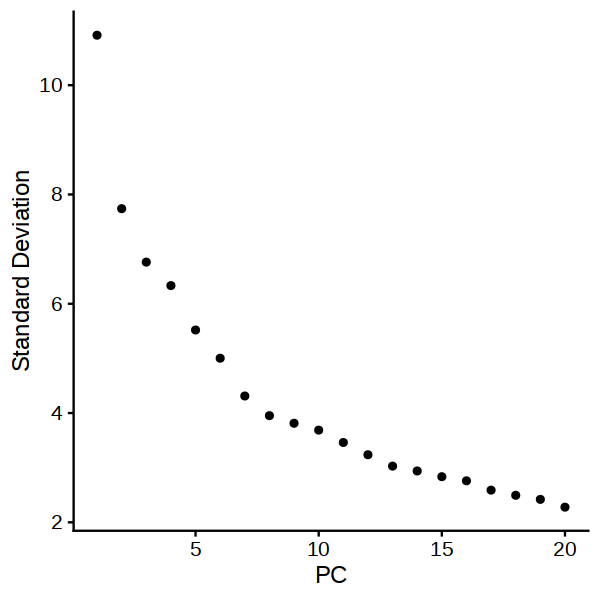

In [32]:
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = multiome_seurat)

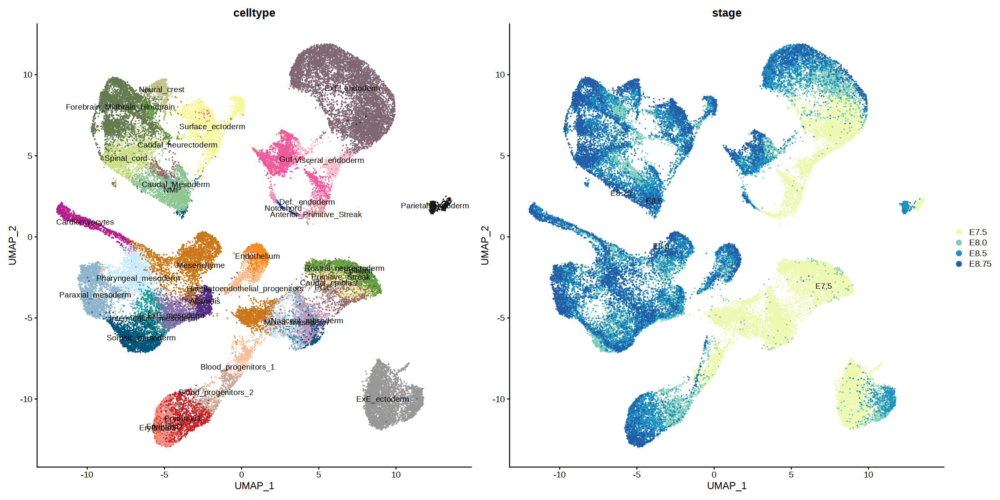

In [33]:
multiome_seurat <- RunUMAP(multiome_seurat, reduction = "pca", dims = 1:20, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(multiome_seurat, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=opts$celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(multiome_seurat, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE) + scale_color_manual(values=opts$stage.colors)
p3 + p4

#### multiome atlas - with regressing variables

In [22]:
# Run the standard workflow for visualization and clustering
multiome_seurat_regress <- ScaleData(multiome_seurat, verbose = FALSE, vars.to.regress = c("nFeature_RNA", "nCount_RNA", "mitochondrial_percent_RNA", "ribosomal_percent_RNA"))
multiome_seurat_regress <- RunPCA(multiome_seurat_regress, npcs = 30, verbose = FALSE)

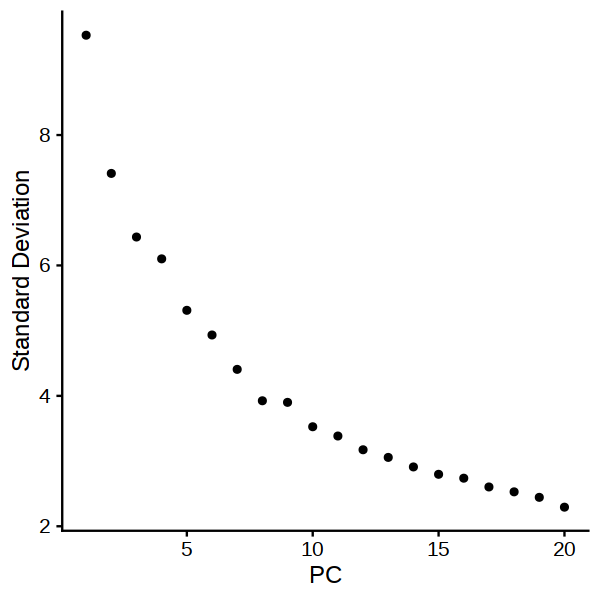

In [35]:
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = multiome_seurat_regress)

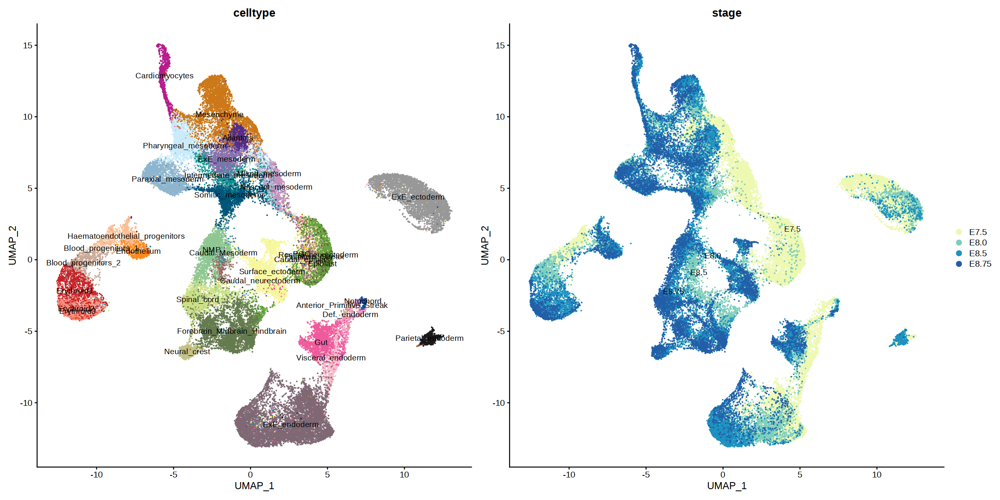

In [36]:
multiome_seurat_regress <- RunUMAP(multiome_seurat_regress, reduction = "pca", dims = 1:20, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(multiome_seurat_regress, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=opts$celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(multiome_seurat_regress, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE) + scale_color_manual(values=opts$stage.colors)
p3 + p4

## Integrating Datasets

In [ ]:
# generate an object list of all the seurat objects to integrate
object.list <- list(original_seurat, multiome_seurat)
features <- SelectIntegrationFeatures(object.list = object.list)

#### Unregressed data

In [ ]:
object.list

In [ ]:
# Multi core using future - built in to seurat
plan("multicore", workers = 1)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

In [ ]:
# Perform integration
anchors <- FindIntegrationAnchors(object.list = object.list, 
                                    #reference = 1,  # atlas as reference
                                    scale = TRUE, # scaling again
                                    anchor.features = features, 
                                    reduction = "rpca", 
                                  #  dims = 1:35,
                                    k.anchor = 15)
# this command creates an 'integrated' data assay
integrated <- IntegrateData(anchorset = anchors)

In [ ]:
saveRDS(integrated, sprintf('%s/integrated_noregression.rds', io$outdir))
saveRDS(anchors, sprintf('%s/anchors_noregression.rds', io$outdir))

In [4]:
integrated = readRDS(sprintf('%s/integrated_noregression.rds', io$outdir))

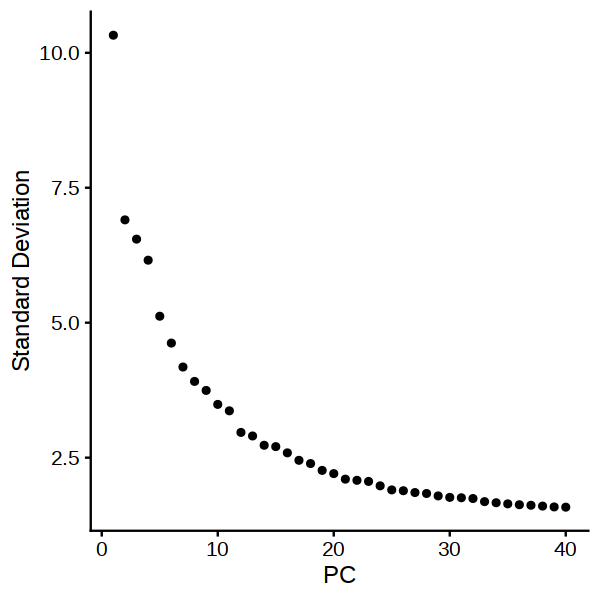

In [8]:
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(integrated) <- "integrated"

# Run the standard workflow for visualization and clustering
integrated <- ScaleData(integrated, verbose = FALSE)
integrated <- RunPCA(integrated, npcs = 40, verbose = FALSE)
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = integrated, ndims = 40)

In [9]:
integrated <- RunUMAP(integrated, reduction = "pca", dims = 1:35, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=8)


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


ERROR: Error in is.data.frame(x): object 'multiome_seurat_regress' not found


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Warning message:
“ggrepel: 6 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


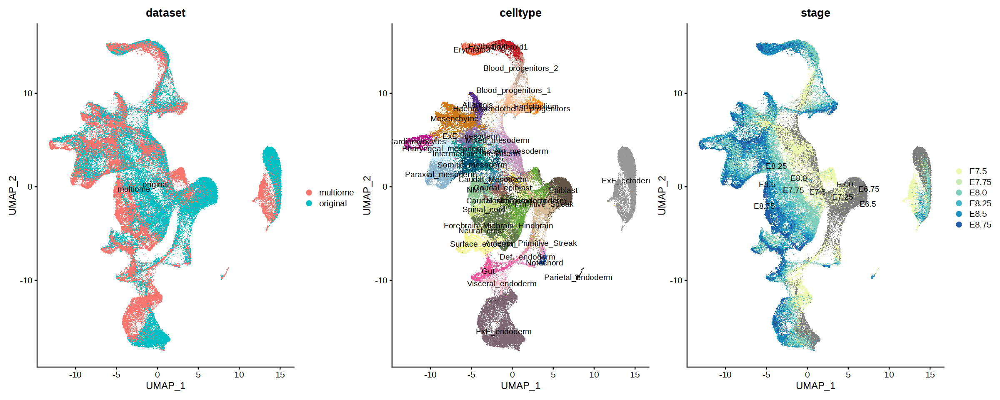

In [10]:
p1 <- DimPlot(integrated, reduction = "umap", group.by = "dataset", label = TRUE)
p3 <- DimPlot(integrated, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=opts$celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(integrated, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE) + scale_color_manual(values=opts$stage.colors)
p1 + p3 + p4

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



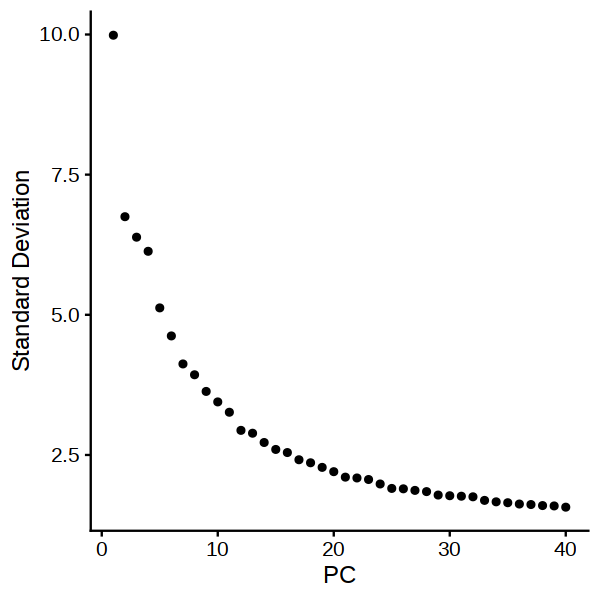

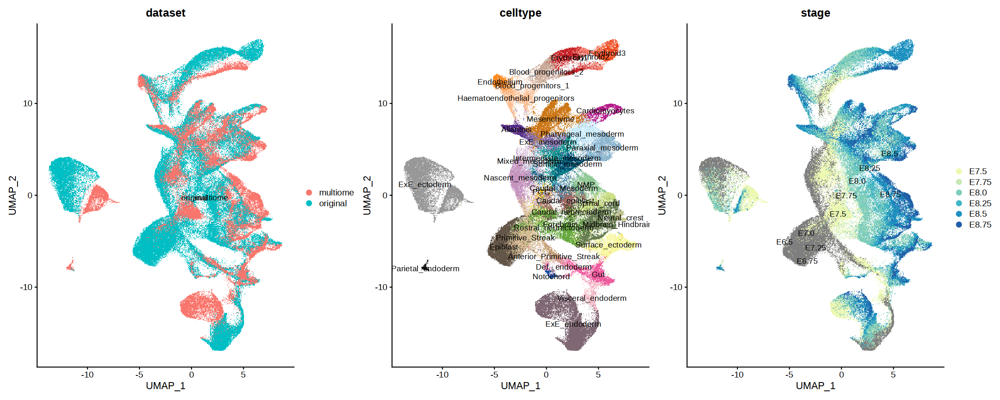

In [59]:
# Integration on non-regressed data but then regressing variables when making the umap
integrated = readRDS(sprintf('%s/integrated_noregression.rds', io$outdir))
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(integrated) <- "integrated"

# Run the standard workflow for visualization and clustering
integrated <- ScaleData(integrated, verbose = FALSE, vars.to.regress = c("nFeature_RNA", "nCount_RNA", "mitochondrial_percent_RNA", "ribosomal_percent_RNA"))
integrated <- RunPCA(integrated, npcs = 40, verbose = FALSE)
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = integrated, ndims = 40)

# UMAP
integrated <- RunUMAP(integrated, reduction = "pca", dims = 1:35, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=8)
p1 <- DimPlot(integrated, reduction = "umap", group.by = "dataset", label = TRUE)
p3 <- DimPlot(integrated, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=opts$celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(integrated, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE) + scale_color_manual(values=opts$stage.colors)
p1 + p3 + p4

#### regressed data

In [33]:
# generate an object list of all the seurat objects to integrate
object.list <- list(original_seurat_regress, multiome_seurat_regress)
features <- SelectIntegrationFeatures(object.list = object.list)

In [34]:
# Perform integration
anchors <- FindIntegrationAnchors(object.list = object.list, 
                                    reference = 1,  # atlas as reference -> not done in previous test
                                    scale = FALSE, # SKIP scaling again
                                    anchor.features = features, 
                                    reduction = "rpca", 
                                    #dims = 1:35,
                                    k.anchor = 15)
# this command creates an 'integrated' data assay
integrated_regress <- IntegrateData(anchorset = anchors)

Computing within dataset neighborhoods

Finding anchors between all query and reference datasets

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 23965 anchors


Integrating dataset 2 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data

Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


In [35]:
saveRDS(integrated_regress, sprintf('%s/integrated_regression.rds', io$outdir))
saveRDS(anchors, sprintf('%s/anchors_regression.rds', io$outdir))

In [46]:
integrated_regress = readRDS(sprintf('%s/integrated_regression.rds', io$outdir))

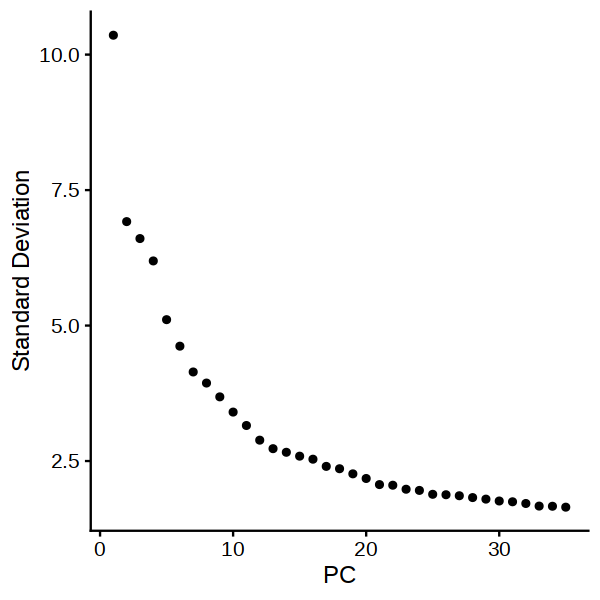

In [47]:
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(integrated_regress) <- "integrated"

# Run the standard workflow for visualization and clustering
integrated_regress <- ScaleData(integrated_regress, verbose = FALSE)
integrated_regress <- RunPCA(integrated_regress, npcs = 35, verbose = FALSE)
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = integrated_regress, ndims = 35)

In [48]:
integrated_regress <- RunUMAP(integrated_regress, reduction = "pca", dims = 1:35, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=10)

In [49]:
integrated_regress@meta.data$celltype_PijuanSala2019 = gsub(' ', '_', gsub('/', '_', integrated_regress@meta.data$celltype_PijuanSala2019))    
integrated_regress@meta.data$celltype = ifelse(is.na(integrated_regress@meta.data$celltype), integrated_regress@meta.data$celltype_PijuanSala2019, integrated_regress@meta.data$celltype)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



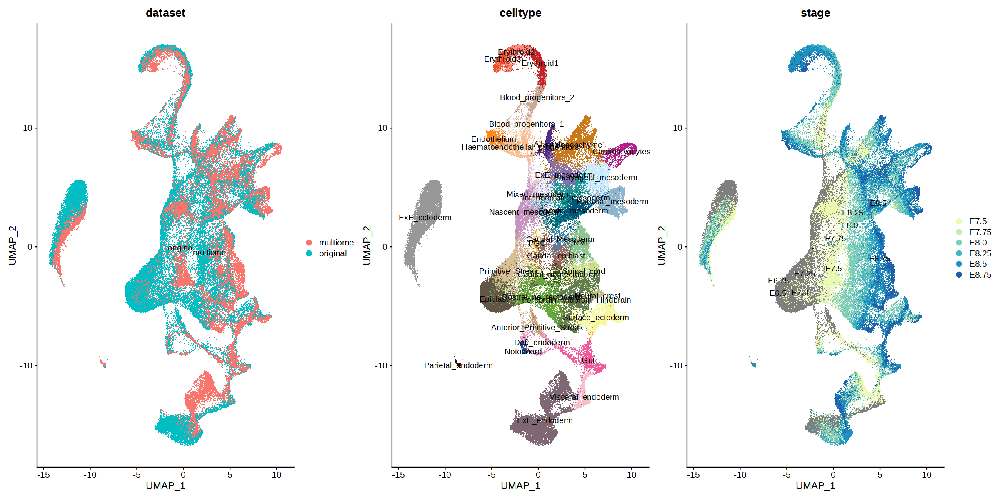

In [58]:
# Visualization
p1 <- DimPlot(integrated_regress, reduction = "umap", group.by = "dataset", label = TRUE)
p3 <- DimPlot(integrated_regress, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=opts$celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(integrated_regress, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE) + scale_color_manual(values=opts$stage.colors)
p1 + p3 + p4

#### half-regressed data

In [37]:
# generate an object list of all the seurat objects to integrate
object.list <- list(original_seurat, multiome_seurat_regress)
features <- SelectIntegrationFeatures(object.list = object.list)

In [38]:
# Perform integration
anchors <- FindIntegrationAnchors(object.list = object.list, 
                                    reference = 1,  # atlas as reference -> not done in previous test
                                    scale = FALSE, # SKIP scaling again
                                    anchor.features = features, 
                                    reduction = "rpca", 
                                    #dims = 1:35,
                                    k.anchor = 15)
# this command creates an 'integrated' data assay
integrated_regress <- IntegrateData(anchorset = anchors)

Computing within dataset neighborhoods

Finding anchors between all query and reference datasets

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 22424 anchors


Integrating dataset 2 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data

Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


In [39]:
saveRDS(integrated_regress, sprintf('%s/integrated_halfregression.rds', io$outdir))
saveRDS(anchors, sprintf('%s/anchors_halfregression.rds', io$outdir))

In [40]:
integrated_regress = readRDS(sprintf('%s/integrated_halfregression.rds', io$outdir))

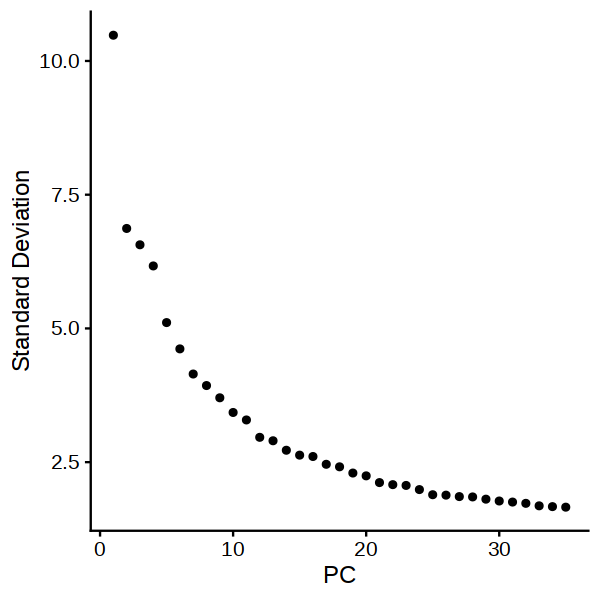

In [41]:
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(integrated_regress) <- "integrated"

# Run the standard workflow for visualization and clustering
integrated_regress <- ScaleData(integrated_regress, verbose = FALSE)
integrated_regress <- RunPCA(integrated_regress, npcs = 35, verbose = FALSE)
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = integrated_regress, ndims = 35)

In [42]:
integrated_regress <- RunUMAP(integrated_regress, reduction = "pca", dims = 1:35, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=10)

In [43]:
integrated_regress@meta.data$celltype_PijuanSala2019 = gsub(' ', '_', gsub('/', '_', integrated_regress@meta.data$celltype_PijuanSala2019))    
integrated_regress@meta.data$celltype = ifelse(is.na(integrated_regress@meta.data$celltype), integrated_regress@meta.data$celltype_PijuanSala2019, integrated_regress@meta.data$celltype)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



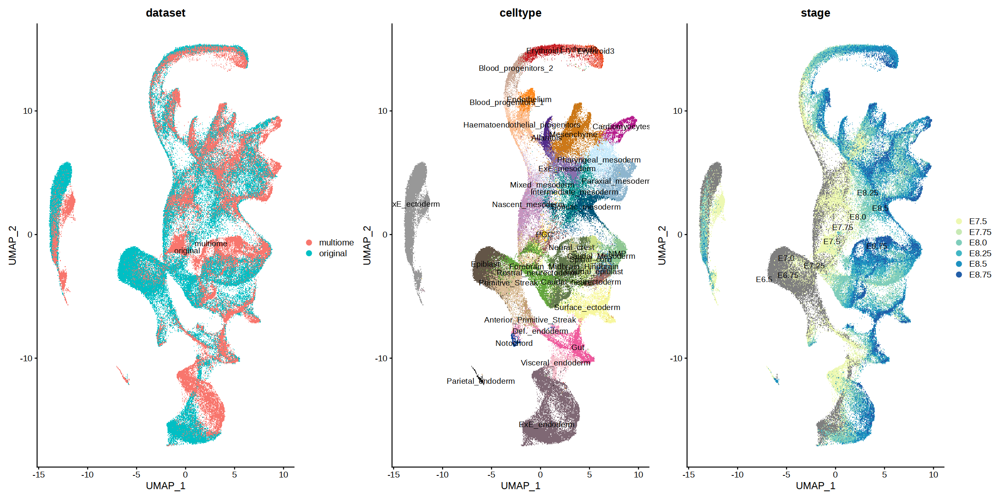

In [44]:
# Visualization
p1 <- DimPlot(integrated_regress, reduction = "umap", group.by = "dataset", label = TRUE)
p3 <- DimPlot(integrated_regress, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=opts$celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(integrated_regress, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE) + scale_color_manual(values=opts$stage.colors)
p1 + p3 + p4

# Fully regressed integration looks best --> continue with label transfer

In [24]:
### Integrations anchors don't work, need to get TransferAnchors:


# generate an object list of all the seurat objects to integrate
object.list <- list(original_seurat_regress, multiome_seurat_regress)
features <- SelectIntegrationFeatures(object.list = object.list)

# Multi core using future - built in to seurat
plan("multicore", workers = 24)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

# Perform integration
anchors <-  FindTransferAnchors(
                                reference = original_seurat_regress,  # atlas as reference -> not done in previous test
                                query =  multiome_seurat_regress, 
                                scale = FALSE, # SKIP scaling again
                                reference.reduction = "pca",
                                features = features,
                                k.anchor = 10)

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 25840 anchors

Filtering anchors

	Retained 10360 anchors



In [25]:
predictions <- TransferData(anchorset = anchors, refdata = original_seurat_regress$celltype_extended_atlas,
    dims = 1:30)

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [26]:
head(predictions)

,predicted.id,prediction.score.Epiblast,prediction.score.Primitive.Streak,prediction.score.ExE.ectoderm,prediction.score.Visceral.endoderm,prediction.score.ExE.endoderm,prediction.score.Non.neural.ectoderm,prediction.score.Nascent.mesoderm,prediction.score.Ectoderm,prediction.score.Blood.progenitors,⋯,prediction.score.Megakaryocyte.progenitors,prediction.score.Branchial.arch.neural.crest,prediction.score.Cardiopharyngeal.progenitors,prediction.score.Chorioallantoic.derived.erythroid.progenitors,prediction.score.Otic.neural.progenitors,prediction.score.Frontonasal.mesenchyme,prediction.score.Early.dorsal.forebrain.progenitors,prediction.score.YS.mesothelium.derived.endothelial.progenitors,prediction.score.Forelimb,prediction.score.max
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
E7.5_rep1#AAACAGCCAAACTCAT-1,Caudal epiblast,0.0000000,0.38322891,0,0,0.00000000,0.00000000,0.0000000,0.10383296,0,⋯,0,0,0,0,0,0,0,0,0,0.5129381
E7.5_rep1#AAACAGCCACAACCTA-1,ExE ectoderm,0.0000000,0.00000000,1,0,0.00000000,0.00000000,0.0000000,0.00000000,0,⋯,0,0,0,0,0,0,0,0,0,1.0000000
E7.5_rep1#AAACAGCCATCCTGAA-1,Nascent mesoderm,0.0000000,0.05496929,0,0,0.00000000,0.01296846,0.8514493,0.01622229,0,⋯,0,0,0,0,0,0,0,0,0,0.8514493
E7.5_rep1#AAACAGCCATGCTATG-1,Primitive Streak,0.2607423,0.45682728,0,0,0.00000000,0.00000000,0.0000000,0.24792536,0,⋯,0,0,0,0,0,0,0,0,0,0.4568273
E7.5_rep1#AAACATGCAACCTGGT-1,Parietal endoderm,0.0000000,0.00000000,0,0,0.02486644,0.00000000,0.0000000,0.00000000,0,⋯,0,0,0,0,0,0,0,0,0,0.9751336
E7.5_rep1#AAACATGCAATGAATG-1,Nascent mesoderm,0.0000000,0.00000000,0,0,0.00000000,0.00000000,0.5751760,0.00000000,0,⋯,0,0,0,0,0,0,0,0,0,0.5751760


In [66]:
fwrite(predictions, sprintf('%s/celltype_extended_atlas_pred.txt.gz', io$outdir))

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


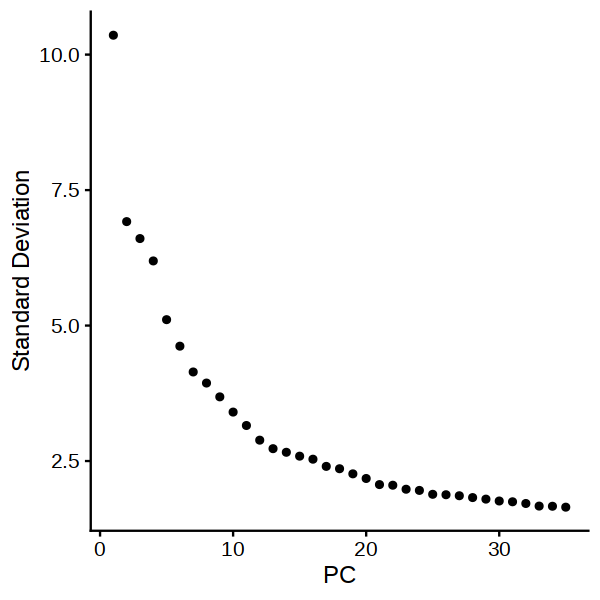

In [27]:
# project on umap of integrated data
integrated_regress = readRDS(sprintf('%s/integrated_regression.rds', io$outdir))
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(integrated_regress) <- "integrated"

# Run the standard workflow for visualization and clustering
integrated_regress <- ScaleData(integrated_regress, verbose = FALSE)
integrated_regress <- RunPCA(integrated_regress, npcs = 35, verbose = FALSE)
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = integrated_regress, ndims = 35)

integrated_regress <- RunUMAP(integrated_regress, reduction = "pca", dims = 1:35, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=10)

In [33]:
head(colnames(integrated_regress))

[1] "cell_1" "cell_2" "cell_5" "cell_6" "cell_8" "cell_9"

In [32]:
head(integrated_regress@meta.data)

,orig.ident,nCount_originalexp,nFeature_originalexp,cell,sample,embryo_version,stage,stage_mixed_gastrulation_mapped,somite_count,anatomy,⋯,mitochondrial_percent_RNA,ribosomal_percent_RNA,barcode,genotype,pass_rnaQC,doublet_score,doublet_call,celltype,celltype.score,closest.cell
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<dbl>,<lgl>,<chr>,<dbl>,<chr>
cell_1,cell,8961,2545,cell_1,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,⋯,0,27.48577,NA,NA,NA,NA,NA,NA,NA,NA
cell_2,cell,19566,3719,cell_2,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,⋯,0,27.33824,NA,NA,NA,NA,NA,NA,NA,NA
cell_5,cell,14183,3474,cell_5,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,⋯,0,26.66573,NA,NA,NA,NA,NA,NA,NA,NA
cell_6,cell,20340,3861,cell_6,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,⋯,0,27.38446,NA,NA,NA,NA,NA,NA,NA,NA
cell_8,cell,22536,4036,cell_8,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,⋯,0,26.41551,NA,NA,NA,NA,NA,NA,NA,NA
cell_9,cell,24497,4347,cell_9,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,⋯,0,26.94207,NA,NA,NA,NA,NA,NA,NA,NA


In [ ]:
# Add predictions metadata

In [34]:
predicted_celltypes = data.table(cell= c(rownames(predictions), as.data.table(integrated_regress@meta.data)[dataset=='original', cell]),
                                 celltype = c(predictions$predicted.id, as.data.table(integrated_regress@meta.data)[dataset=='original', celltype_extended_atlas])) %>%
    .[match(colnames(integrated_regress), cell)]

In [36]:
integrated_regress@meta.data$predicted_celltype = predicted_celltypes$celltype

In [37]:
opts$extended_celltype.colors = c(
 "Epiblast" = "#635547",
"Primitive Streak" = "#DABE99",
"Caudal epiblast" = "#9e6762",

"PGC" = "#FACB12",

"Anterior Primitive Streak" = "#c19f70",
"Node"="#153b3d",
"Notochord" = "#0F4A9C",



"Gut tube" = "#EF5A9D",
"Hindgut" = "#F397C0",
"Midgut" = "#ff00b2",
"Foregut" = "#ffb7ff",
"Pharyngeal endoderm"="#95e1ff",
"Thyroid primordium"="#97bad3",

"Nascent mesoderm" = "#C594BF",
"Intermediate mesoderm" = "#139992",
"Caudal mesoderm" = "#3F84AA",
"Lateral plate mesoderm" = "#F9DFE6",
"Limb mesoderm" = "#e35f82",
"Forelimb" = "#d02d75",
"Kidney primordium" = "#e85639",
"Presomitic mesoderm"="#5581ca",#"#0000ff",#blue
"Somitic mesoderm" = "#005579",
"Posterior somitic tissues" = "#5adbe4",#"#40e0d0",#turquoise



"Paraxial mesoderm" = "#8DB5CE",
"Cranial mesoderm" = "#456722",#"#006400",#darkgreen
"Anterior somitic tissues"= "#d5e839",
"Sclerotome" = "#e3cb3a",#"#ffff00",#yellow
"Dermomyotome" = "#00BFC4",#"#a52a2a",#brown



"Pharyngeal mesoderm" = "#C9EBFB",
"Cardiopharyngeal progenitors" = "#556789",
"Anterior cardiopharyngeal progenitors"="#683ed8",



"Allantois" = "#532C8A",
"Mesenchyme" = "#cc7818",
"YS mesothelium" = "#ff7f9c",
"Epicardium"="#f79083",
"Embryo proper mesothelium" = "#ff487d",



"Cardiopharyngeal progenitors FHF"="#d780b0",
"Cardiomyocytes FHF 1"="#a64d7e",
"Cardiomyocytes FHF 2"="#B51D8D",



"Cardiopharyngeal progenitors SHF"="#4b7193",
"Cardiomyocytes SHF 1"="#5d70dc",
"Cardiomyocytes SHF 2"="#332c6c",



"Haematoendothelial progenitors" = "#FBBE92",
"Blood progenitors" = "#6c4b4c",
"Erythroid" = "#C72228",
"Chorioallantoic-derived erythroid progenitors"="#E50000",
"Megakaryocyte progenitors"="#e3cb3a",
"MEP"="#EF4E22",
"EMP"="#7c2a47",



"YS endothelium"="#ff891c",
"YS mesothelium-derived endothelial progenitors"="#AE3F3F",
"Allantois endothelium"="#2f4a60",
"Embryo proper endothelium"="#90e3bf",
"Venous endothelium"="#bd3400",
"Endocardium"="#9d0049",

"NMPs/Mesoderm-biased" = "#89c1f5",
"NMPs" = "#8EC792",

"Ectoderm" = "#ff675c",



"Optic vesicle" = "#bd7300",

"Ventral forebrain progenitors"="#a0b689",
"Early dorsal forebrain progenitors"="#0f8073",
"Late dorsal forebrain progenitors"="#7a9941",
"Midbrain/Hindbrain boundary"="#8ab3b5",
"Midbrain progenitors"="#9bf981",
"Dorsal midbrain neurons"="#12ed4c",
"Ventral hindbrain progenitors"="#7e907a",
"Dorsal hindbrain progenitors"="#2c6521",
"Hindbrain floor plate"="#bf9da8",
"Hindbrain neural progenitors"="#59b545",



"Neural tube"="#233629",



"Migratory neural crest"="#4a6798",
"Branchial arch neural crest"="#bd84b0",
"Frontonasal mesenchyme"="#d3b1b1",



"Spinal cord progenitors"="#6b2035",
"Dorsal spinal cord progenitors"="#e273d6",

"Non-neural ectoderm" = "#f7f79e",
"Surface ectoderm" = "#fcff00",
"Epidermis" = "#fff335",
"Limb ectoderm" = "#ffd731",
"Amniotic ectoderm" = "#dbb400",



"Placodal ectoderm" = "#ff5c00",



"Otic placode"="#f1a262",
"Otic neural progenitors"="#00b000",

"Visceral endoderm" = "#F6BFCB",
"ExE endoderm" = "#7F6874",
"ExE ectoderm" = "#989898",
"Parietal endoderm" = "#1A1A1A"
)

In [41]:
# Visualization
p1 <- DimPlot(integrated_regress, reduction = "umap", group.by = "dataset", label = TRUE)
p3 <- DimPlot(integrated_regress, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=opts$celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(integrated_regress, reduction = "umap", group.by = "predicted_celltype", label = TRUE, repel = TRUE) + scale_color_manual(values=opts$extended_celltype.colors)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



In [57]:
umap = integrated_regress@reductions$umap@cell.embeddings

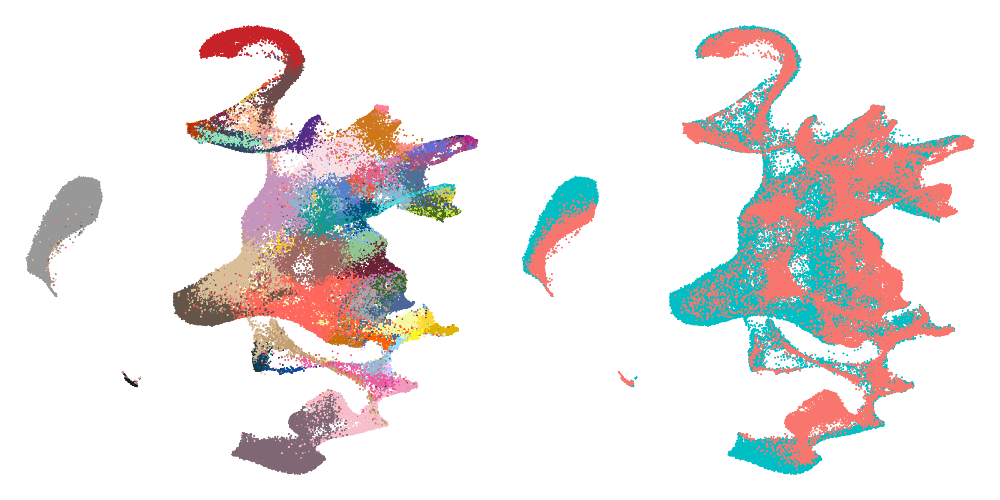

In [63]:
p1 = ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$predicted_celltype)) + 
    geom_point(size=0.3) + 
    scale_color_manual(values=opts$extended_celltype.colors) + 
    theme_void() + 
    theme(legend.position='none')
p2 = ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$dataset)) + 
    geom_point(size=0.3) + 
    theme_void() + 
    theme(legend.position='none')
p1 + p2

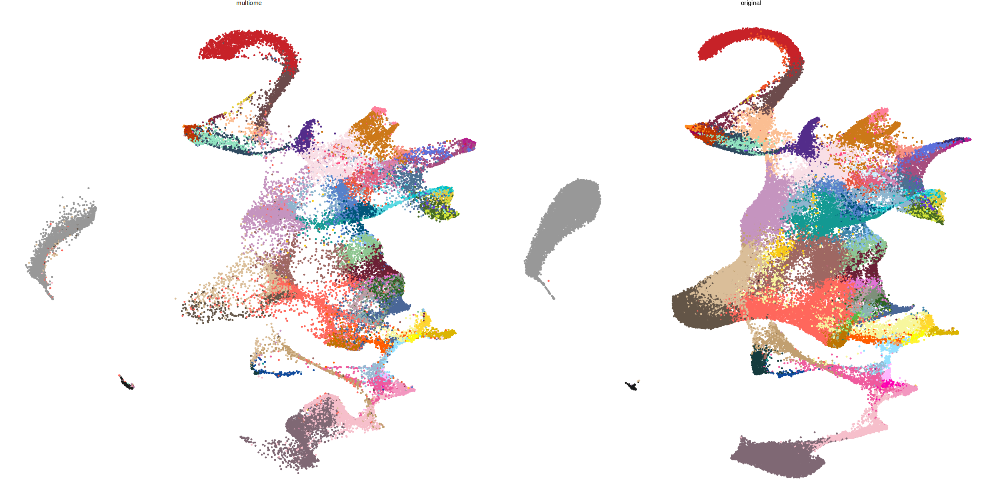

In [64]:
ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$predicted_celltype)) + 
    geom_point(size=0.3) + 
    scale_color_manual(values=opts$extended_celltype.colors) + 
    theme_void() + 
    facet_grid(~integrated_regress$dataset) + 
    theme(legend.position='none')

In [67]:
# Repredict original annotation
predictions <- TransferData(anchorset = anchors, refdata = original_seurat_regress$celltype_PijuanSala2019,
    dims = 1:30)

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [68]:
predicted_celltypes_orig = data.table(cell= c(rownames(predictions), as.data.table(integrated_regress@meta.data)[dataset=='original', cell]),
                                 celltype = c(predictions$predicted.id, as.data.table(integrated_regress@meta.data)[dataset=='original', celltype_PijuanSala2019])) %>%
    .[match(colnames(integrated_regress), cell)]

In [69]:
integrated_regress@meta.data$predicted_celltype_orig = predicted_celltypes_orig$celltype

In [71]:
integrated_regress@meta.data$predicted_celltype_orig = gsub(' ', '_', gsub('/', '_',  integrated_regress@meta.data$predicted_celltype_orig))

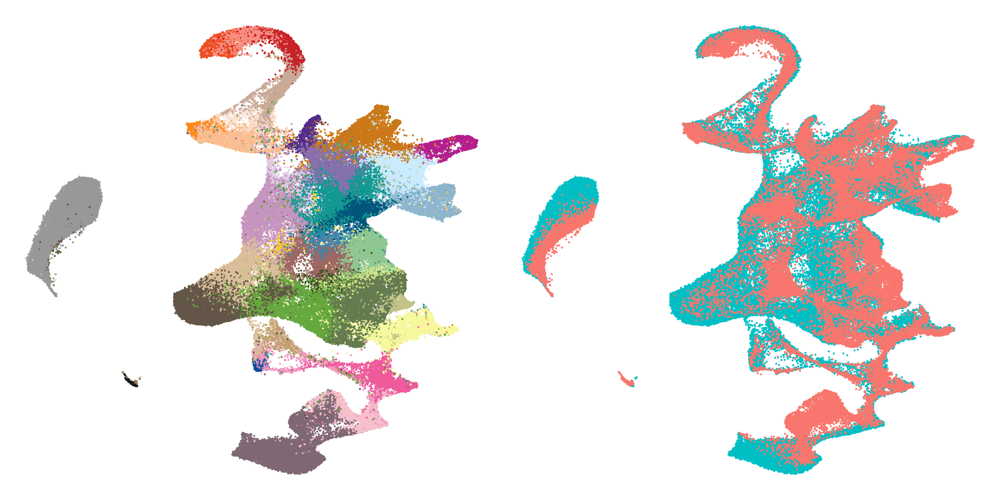

In [72]:
p1 = ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$predicted_celltype_orig)) + 
    geom_point(size=0.3) + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + 
    theme(legend.position='none')
p2 = ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$dataset)) + 
    geom_point(size=0.3) + 
    theme_void() + 
    theme(legend.position='none')
p1 + p2

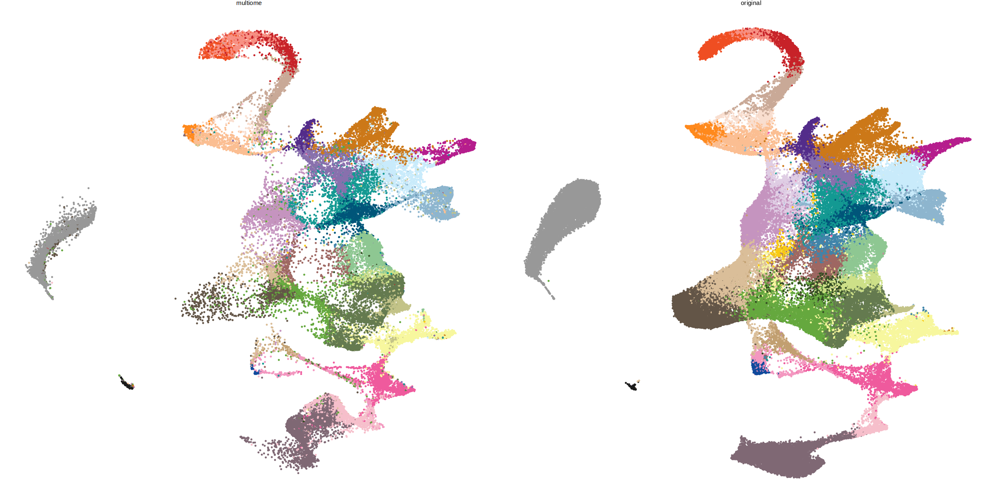

In [73]:
ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$predicted_celltype_orig)) + 
    geom_point(size=0.3) + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + 
    facet_grid(~integrated_regress$dataset) + 
    theme(legend.position='none')

In [86]:
# Repredict original annotation
predictions <- TransferData(anchorset = anchors, 
                            refdata = original_seurat_regress$celltype_PijuanSala2019,
                            dims = 1:30,
                            k.weight = 25)

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [87]:
predicted_celltypes_orig = data.table(cell= c(rownames(predictions), as.data.table(integrated_regress@meta.data)[dataset=='original', cell]),
                                 celltype = c(predictions$predicted.id, as.data.table(integrated_regress@meta.data)[dataset=='original', celltype_PijuanSala2019])) %>%
    .[match(colnames(integrated_regress), cell)]

In [88]:
integrated_regress@meta.data$predicted_celltype_orig = predicted_celltypes_orig$celltype

In [89]:
integrated_regress@meta.data$predicted_celltype_orig = gsub(' ', '_', gsub('/', '_',  integrated_regress@meta.data$predicted_celltype_orig))

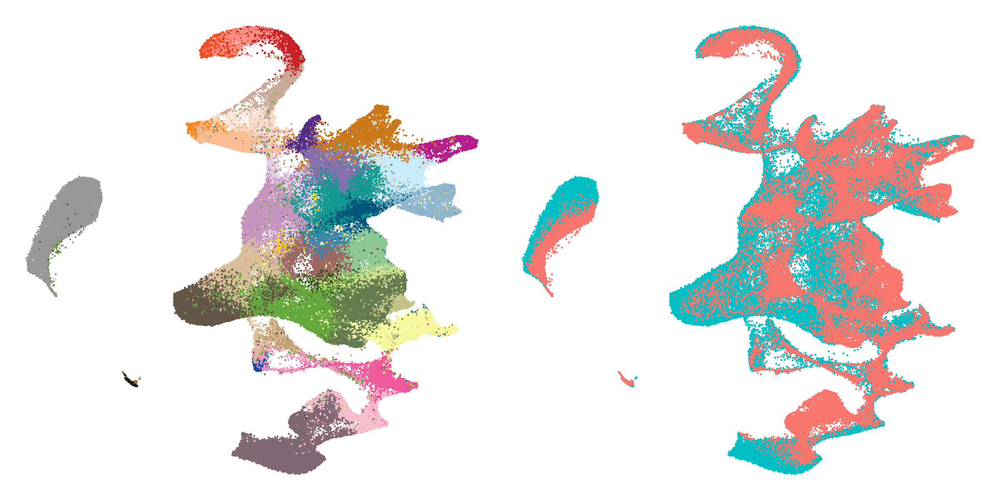

In [90]:
p1 = ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$predicted_celltype_orig)) + 
    geom_point(size=0.3) + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + 
    theme(legend.position='none')
p2 = ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$dataset)) + 
    geom_point(size=0.3) + 
    theme_void() + 
    theme(legend.position='none')
p1 + p2

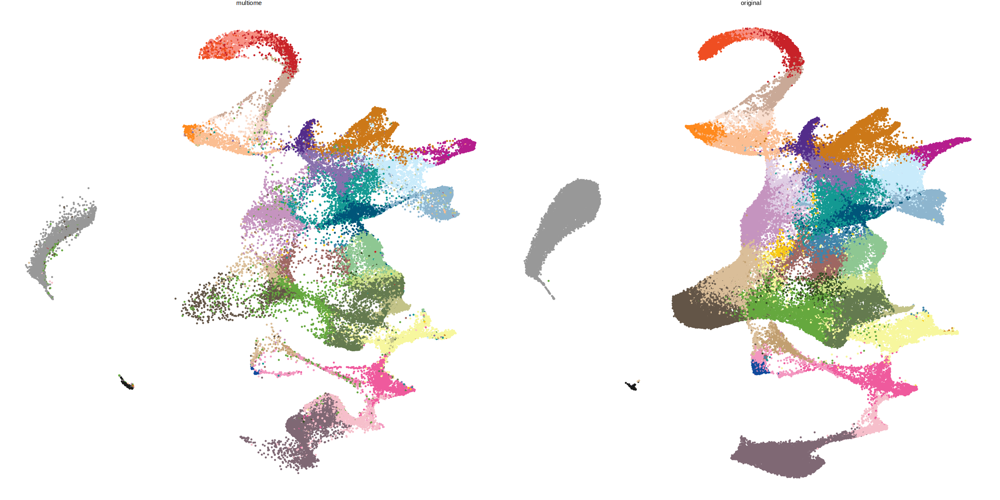

In [91]:
ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$predicted_celltype_orig)) + 
    geom_point(size=0.3) + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + 
    facet_grid(~integrated_regress$dataset) + 
    theme(legend.position='none')

In [112]:
head(table)

V1,V2,N
<chr>,<chr>,<int>
Allantois,Allantois,633
Anterior_Primitive_Streak,Allantois,0
Blood_progenitors_1,Allantois,0
Blood_progenitors_2,Allantois,0
Cardiomyocytes,Allantois,0
Caudal_epiblast,Allantois,0


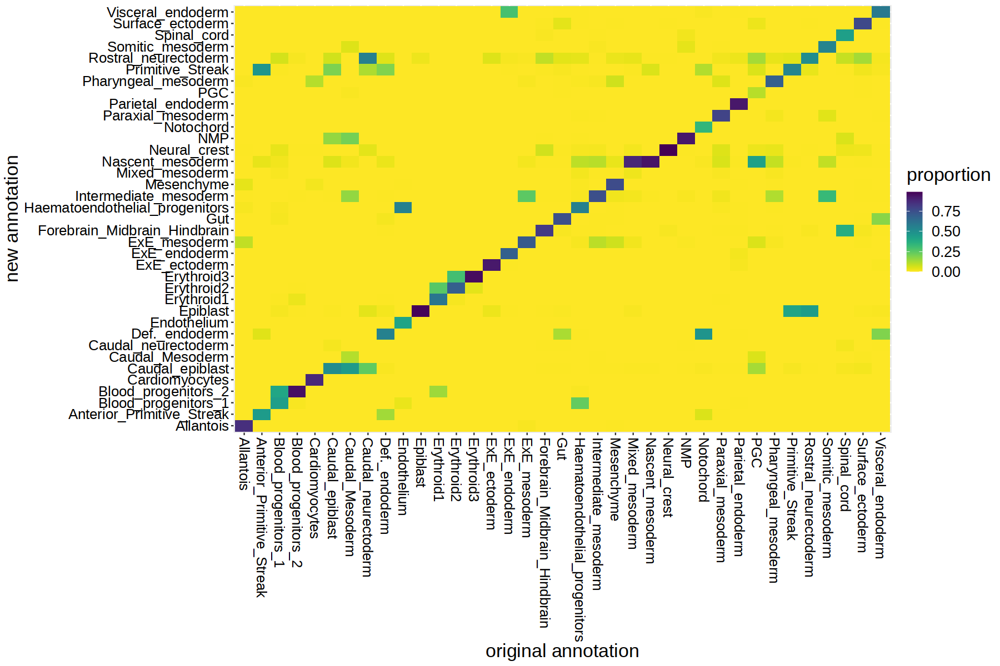

In [118]:
meta = as.data.table(integrated_regress@meta.data)[dataset=='multiome']
table = as.data.table(table(meta$celltype, meta$predicted_celltype_orig)) %>%
    .[,N_tot:=sum(N), by='V1'] %>%
    .[,prop:=N/N_tot] %>%
    unique(by=c('V1', 'V2'))
options(repr.plot.width=15, repr.plot.height=10)
ggplot(table, aes(V1, V2, fill=prop)) + 
    geom_tile() + 
    viridis::scale_fill_viridis(begin=1, end=0, name='proportion') + 
    xlab('original annotation') + ylab('new annotation') +
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5, color='black', size=15),
         axis.text.y = element_text(size=15, color='black'),
         text = element_text(size=20))
options(repr.plot.width=20, repr.plot.height=10)

In [93]:
bu = integrated_regress$celltype

In [94]:
integrated_regress$celltype = ifelse(is.na(integrated_regress$celltype), integrated_regress$predicted_celltype_orig, integrated_regress$celltype)

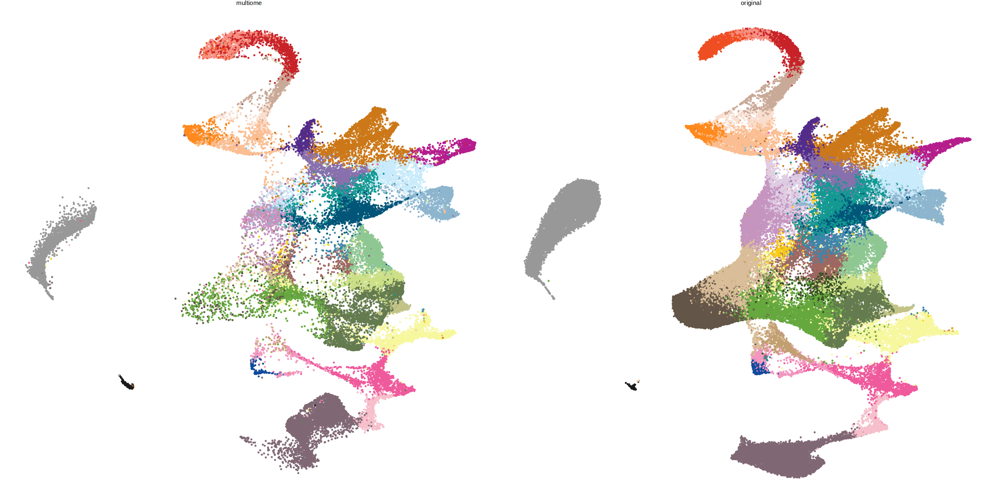

In [95]:
ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$celltype)) + 
    geom_point(size=0.3) + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + 
    facet_grid(~integrated_regress$dataset) + 
    theme(legend.position='none')

In [102]:
predictions <- TransferData(anchorset = anchors, refdata = original_seurat_regress$celltype_extended_atlas,
    dims = 1:30,
                            k.weight = 10)

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [103]:
predicted_celltypes = data.table(cell= c(rownames(predictions), as.data.table(integrated_regress@meta.data)[dataset=='original', cell]),
                                 celltype = c(predictions$predicted.id, as.data.table(integrated_regress@meta.data)[dataset=='original', celltype_extended_atlas])) %>%
    .[match(colnames(integrated_regress), cell)]

In [104]:
integrated_regress@meta.data$predicted_celltype = predicted_celltypes$celltype

In [105]:
umap = integrated_regress@reductions$umap@cell.embeddings

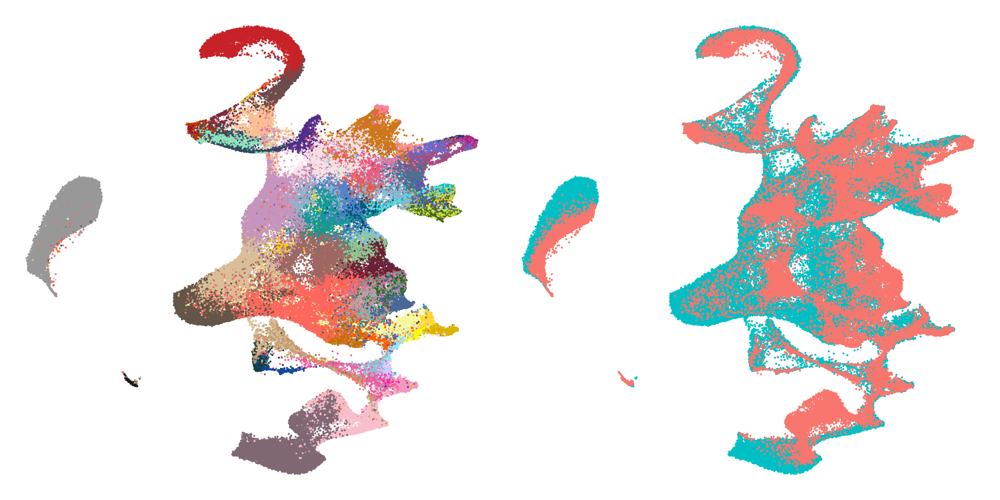

In [106]:
p1 = ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$predicted_celltype)) + 
    geom_point(size=0.3) + 
    scale_color_manual(values=opts$extended_celltype.colors) + 
    theme_void() + 
    theme(legend.position='none')
p2 = ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$dataset)) + 
    geom_point(size=0.3) + 
    theme_void() + 
    theme(legend.position='none')
p1 + p2

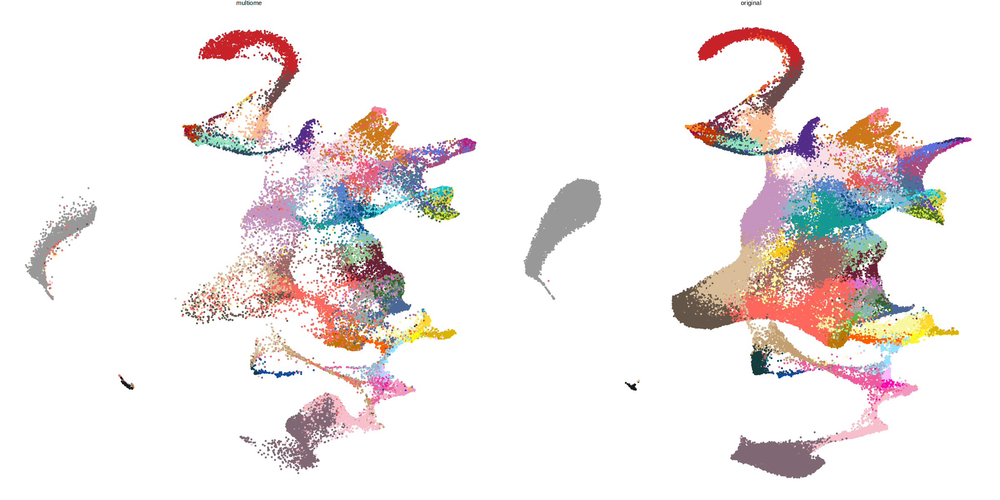

In [107]:
ggplot(as.data.frame(umap), aes(UMAP_1, UMAP_2, col=integrated_regress$predicted_celltype)) + 
    geom_point(size=0.3) + 
    scale_color_manual(values=opts$extended_celltype.colors) + 
    theme_void() + 
    facet_grid(~integrated_regress$dataset) + 
    theme(legend.position='none')